In [2]:
# Para visualización en notebook
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['font.size'] = 22
from IPython.display import Audio, Markdown, Image
import seaborn as sns

# Números y Datos
import numpy as np
import pandas as pd

# Archivos
import urllib.request
import glob

# Análisis de sonido
import spotipy 

# Machine learning
# importar los paquetes para clustering
from sklearn.preprocessing import StandardScaler

# To work with categorical types
from pandas.api.types import CategoricalDtype

# Trabajo Práctico 1



## Carga metadata y audio_features

In [4]:
metadata = pd.read_csv('data/metadata.csv', index_col='id')
audio_features = pd.read_csv('data/audio_features.csv', index_col='id')

In [3]:
metadata.head()

,album,artists,available_markets,disc_number,duration_ms,explicit,external_ids,external_urls,href,is_local,name,popularity,preview_url,track_number,type,uri,genre
id,,,,,,,,,,,,,,,,,
5i2sgqnzaxYpvXmGAB592h,"{'album_type': 'ALBUM', 'artists': [{'external...",Stan Getz,[],1,253933,False,{'isrc': 'USPR36307074'},{'spotify': 'https://open.spotify.com/track/5i...,https://api.spotify.com/v1/tracks/5i2sgqnzaxYp...,False,Corcovado - Quiet Nights Of Quiet Stars,12,NaN,5,track,spotify:track:5i2sgqnzaxYpvXmGAB592h,jazz
4mGzm5ahHxMX5IhVWbU7cl,"{'album_type': 'ALBUM', 'artists': [{'external...",Nina Simone,[],1,249823,False,{'isrc': 'QMSGD1370010'},{'spotify': 'https://open.spotify.com/track/4m...,https://api.spotify.com/v1/tracks/4mGzm5ahHxMX...,False,I Loves You Porgy,6,NaN,10,track,spotify:track:4mGzm5ahHxMX5IhVWbU7cl,jazz
4DEn3hZzSs9MFwFNDla5Y5,"{'album_type': 'ALBUM', 'artists': [{'external...",Chick Corea,"['AD', 'AE', 'AR', 'AT', 'BE', 'BO', 'BR', 'CA...",1,185826,False,{'isrc': 'USC4R0303698'},{'spotify': 'https://open.spotify.com/track/4D...,https://api.spotify.com/v1/tracks/4DEn3hZzSs9M...,False,Swedish Landscape - Live,15,NaN,11,track,spotify:track:4DEn3hZzSs9MFwFNDla5Y5,jazz
5P6vo51dtkBYWXswH1twvK,"{'album_type': 'ALBUM', 'artists': [{'external...",Snarky Puppy,[],1,645893,False,{'isrc': 'US8JA1411008'},{'spotify': 'https://open.spotify.com/track/5P...,https://api.spotify.com/v1/tracks/5P6vo51dtkBY...,False,Lingus,0,NaN,8,track,spotify:track:5P6vo51dtkBYWXswH1twvK,jazz
29TZQMVLv25CBm3bYn2EIQ,"{'album_type': 'ALBUM', 'artists': [{'external...",Sam Rivers,"['AD', 'AE', 'AR', 'AT', 'AU', 'BE', 'BG', 'BH...",1,326400,False,{'isrc': 'USBN20100519'},{'spotify': 'https://open.spotify.com/track/29...,https://api.spotify.com/v1/tracks/29TZQMVLv25C...,False,Kinda Dukish,12,NaN,2,track,spotify:track:29TZQMVLv25CBm3bYn2EIQ,jazz


In [4]:
metadata.dtypes

album                object
artists              object
available_markets    object
disc_number           int64
duration_ms           int64
explicit               bool
external_ids         object
external_urls        object
href                 object
is_local               bool
name                 object
popularity            int64
preview_url          object
track_number          int64
type                 object
uri                  object
genre                object
dtype: object

Con los datos de *metadata*, separar las etiquetas que se podrán utilizar para la validación externa (Artista, Álbum, Género), de los campos que no utilizarán en este TP.

In [5]:
# Ver cómo hacer para extraer el release_date del JSON de album
metadata_reduced = metadata[['artists', 'album', 'genre']]

In [6]:
metadata_reduced.head()

,artists,album,genre
id,,,
5i2sgqnzaxYpvXmGAB592h,Stan Getz,"{'album_type': 'ALBUM', 'artists': [{'external...",jazz
4mGzm5ahHxMX5IhVWbU7cl,Nina Simone,"{'album_type': 'ALBUM', 'artists': [{'external...",jazz
4DEn3hZzSs9MFwFNDla5Y5,Chick Corea,"{'album_type': 'ALBUM', 'artists': [{'external...",jazz
5P6vo51dtkBYWXswH1twvK,Snarky Puppy,"{'album_type': 'ALBUM', 'artists': [{'external...",jazz
29TZQMVLv25CBm3bYn2EIQ,Sam Rivers,"{'album_type': 'ALBUM', 'artists': [{'external...",jazz


In [7]:
metadata_reduced['album'][0]

"{'album_type': 'ALBUM', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/0FMucZsEnCxs5pqBjHjIc8'}, 'href': 'https://api.spotify.com/v1/artists/0FMucZsEnCxs5pqBjHjIc8', 'id': '0FMucZsEnCxs5pqBjHjIc8', 'name': 'Stan Getz', 'type': 'artist', 'uri': 'spotify:artist:0FMucZsEnCxs5pqBjHjIc8'}, {'external_urls': {'spotify': 'https://open.spotify.com/artist/77ZUbcdoU5KCPHNUl8bgQy'}, 'href': 'https://api.spotify.com/v1/artists/77ZUbcdoU5KCPHNUl8bgQy', 'id': '77ZUbcdoU5KCPHNUl8bgQy', 'name': 'João Gilberto', 'type': 'artist', 'uri': 'spotify:artist:77ZUbcdoU5KCPHNUl8bgQy'}], 'available_markets': ['AD', 'AE', 'AR', 'AT', 'AU', 'BE', 'BG', 'BH', 'BO', 'BR', 'CA', 'CH', 'CL', 'CO', 'CR', 'CY', 'CZ', 'DE', 'DK', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'FI', 'FR', 'GB', 'GR', 'GT', 'HK', 'HN', 'HU', 'ID', 'IE', 'IL', 'IN', 'IS', 'IT', 'JO', 'JP', 'KW', 'LB', 'LI', 'LT', 'LU', 'LV', 'MA', 'MC', 'MT', 'MX', 'MY', 'NI', 'NL', 'NO', 'NZ', 'OM', 'PA', 'PE', 'PH', 'PL', 'PS', 'PT', 'P

In [8]:
metadata['genre'].value_counts()

world-music      463
ambient          460
drum-and-bass    451
jazz             427
classical        405
Name: genre, dtype: int64

In [43]:
audio_features.dtypes

acousticness        float64
analysis_url         object
danceability        float64
duration_ms           int64
energy              float64
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
speechiness         float64
tempo               float64
time_signature        int64
track_href           object
type                 object
uri                  object
valence             float64
dtype: object

In [10]:
audio_features.head()

,acousticness,analysis_url,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
id,,,,,,,,,,,,,,,,,
5i2sgqnzaxYpvXmGAB592h,0.957,https://api.spotify.com/v1/audio-analysis/5i2s...,0.524,253933,0.1080,0.001230,0,0.139,-18.361,1,0.0493,127.982,4,https://api.spotify.com/v1/tracks/5i2sgqnzaxYp...,audio_features,spotify:track:5i2sgqnzaxYpvXmGAB592h,0.322
4mGzm5ahHxMX5IhVWbU7cl,0.953,https://api.spotify.com/v1/audio-analysis/4mGz...,0.480,249823,0.0322,0.000004,4,0.098,-23.781,1,0.0604,121.766,4,https://api.spotify.com/v1/tracks/4mGzm5ahHxMX...,audio_features,spotify:track:4mGzm5ahHxMX5IhVWbU7cl,0.172
4DEn3hZzSs9MFwFNDla5Y5,0.989,https://api.spotify.com/v1/audio-analysis/4DEn...,0.394,185827,0.1500,0.908000,5,0.342,-21.133,0,0.0353,97.738,3,https://api.spotify.com/v1/tracks/4DEn3hZzSs9M...,audio_features,spotify:track:4DEn3hZzSs9MFwFNDla5Y5,0.170
5P6vo51dtkBYWXswH1twvK,0.174,https://api.spotify.com/v1/audio-analysis/5P6v...,0.461,645894,0.7730,0.702000,9,0.692,-10.316,0,0.1470,130.109,5,https://api.spotify.com/v1/tracks/5P6vo51dtkBY...,audio_features,spotify:track:5P6vo51dtkBYWXswH1twvK,0.488
29TZQMVLv25CBm3bYn2EIQ,0.436,https://api.spotify.com/v1/audio-analysis/29TZ...,0.452,326400,0.5010,0.900000,10,0.110,-13.149,0,0.0329,111.203,4,https://api.spotify.com/v1/tracks/29TZQMVLv25C...,audio_features,spotify:track:29TZQMVLv25CBm3bYn2EIQ,0.602


Con los datos de *audio_features*, generar un gráfico tipo *scatter matrix*.

In [10]:
audio_features_reduced = audio_features[['acousticness','danceability', 'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness','loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence']]

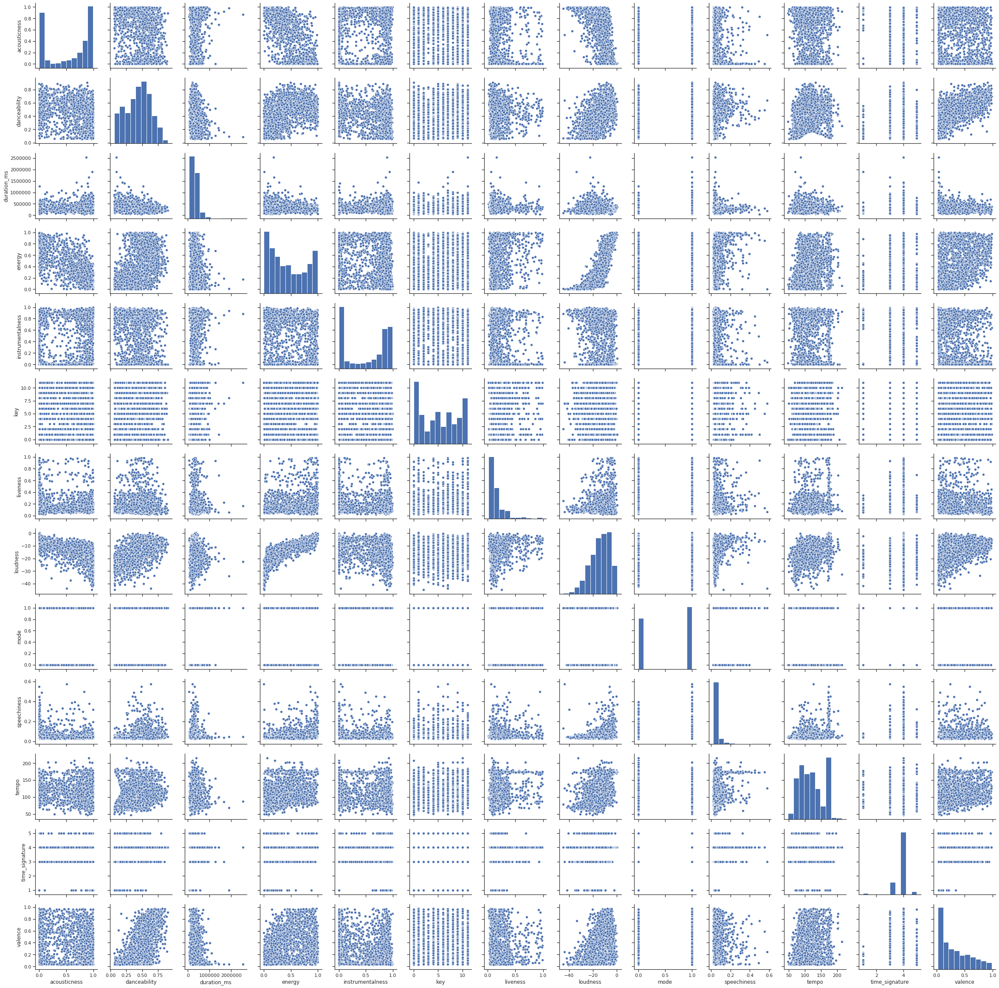

In [12]:
sns.set(style="ticks")
sns.pairplot(audio_features_reduced)


In [13]:
#matriz de correlación
audio_features_reduced.corr()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
acousticness,1.000000,-0.335133,-0.015911,-0.833011,0.199828,-0.116889,-0.241074,-0.716542,0.082901,-0.254333,-0.483857,-0.172753,-0.206942
danceability,-0.335133,1.000000,-0.197828,0.449575,-0.367129,0.062255,0.034854,0.499977,-0.030575,0.177873,0.229456,0.210029,0.680345
duration_ms,-0.015911,-0.197828,1.000000,-0.047300,0.143622,0.017797,0.035349,-0.058933,0.004850,-0.045162,-0.046465,-0.021428,-0.190217
energy,-0.833011,0.449575,-0.047300,1.000000,-0.274126,0.116940,0.285643,0.866154,-0.102209,0.304040,0.541612,0.188939,0.399903
instrumentalness,0.199828,-0.367129,0.143622,-0.274126,1.000000,-0.043105,-0.083062,-0.381098,0.033175,-0.153158,-0.087814,-0.115315,-0.417827
key,-0.116889,0.062255,0.017797,0.116940,-0.043105,1.000000,0.053645,0.095363,-0.173560,0.070067,0.048894,0.015061,0.046637
liveness,-0.241074,0.034854,0.035349,0.285643,-0.083062,0.053645,1.000000,0.229684,-0.025787,0.185036,0.159391,0.036049,0.058733
loudness,-0.716542,0.499977,-0.058933,0.866154,-0.381098,0.095363,0.229684,1.000000,-0.084524,0.218152,0.481935,0.189274,0.409778
mode,0.082901,-0.030575,0.004850,-0.102209,0.033175,-0.173560,-0.025787,-0.084524,1.000000,0.000463,-0.067941,-0.062538,-0.037288
speechiness,-0.254333,0.177873,-0.045162,0.304040,-0.153158,0.070067,0.185036,0.218152,0.000463,1.000000,0.201080,0.065076,0.146733


In [14]:
#features de tipo factor key, mode, time_signature
#audio_features_reduced.key.hist()
audio_features_reduced.time_signature

id
5i2sgqnzaxYpvXmGAB592h    4
4mGzm5ahHxMX5IhVWbU7cl    4
4DEn3hZzSs9MFwFNDla5Y5    3
5P6vo51dtkBYWXswH1twvK    5
29TZQMVLv25CBm3bYn2EIQ    4
4cUgsvo0xRu0JQXIhxcXkZ    4
6gkIIBgZx2661g01Nz5Qtr    4
2uwWxQaPESir0zpeVcHRvC    4
57FfMOh9wOQ7IDDK2tmigg    4
5P7QtBWllP1CQno3Bi834D    4
6bZf2VcN25Hu7jcLNkc5NC    4
3qQVUOHJdgIFWJd0jrG9GE    4
6dZKWYSx5YBIme4SfpIHJ0    4
54zMkQWwYLKTAx2qIkl45X    4
0U070HY5rBmCyh4SIWHrgN    4
7JtcCde09fsajDNHmPFrX7    4
56IF1gMvIEOQeSCWoMT7hx    4
3kOW7LYkOXJ9qE05TlKVc3    4
7MrXwqdwwU57JqIOGtTbRe    4
4LInRUJ6XN1TVnoRVAFcdB    4
7IPEQ3ScOp9cAd3dC7JvDn    4
0TYaiwJB9eLNew2VYxF6i8    4
1gHdnVaBNakuVxPY16Mx6a    4
70Va8NA2Ies98TNa1XuNbl    4
21WlpZiXLelHjdoMUhHfrm    4
14FkDSrkQPko4YMhx6dLI2    4
44MyZZa2SPW0BO9XcmlU9F    4
354gNwpjlW9QKsMPLWdMv5    3
6f6OQJv9qjqyJq9NHin45n    4
5bV5aNKjf4YelnJQHJ5PEI    4
                         ..
3ivi15jAUt262SxGC8vQl4    4
0Zw4llKeB35SIKASy1aLtV    4
5DjNm2iw6u1rwdPWVustEx    4
6ARQSpE9Hhu2U7bZfKNRzX    3
5C0DGc7M86XqwMRPe

In [14]:
audio_features_more_reduced = audio_features[['danceability','energy','loudness','speechiness','acousticness','instrumentalness','valence','tempo','liveness', 'duration_ms']]

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,valence,tempo,liveness,duration_ms
danceability,1.000000,0.449575,0.499977,0.177873,-0.335133,-0.367129,0.680345,0.229456,0.034854,-0.197828
energy,0.449575,1.000000,0.866154,0.304040,-0.833011,-0.274126,0.399903,0.541612,0.285643,-0.047300
loudness,0.499977,0.866154,1.000000,0.218152,-0.716542,-0.381098,0.409778,0.481935,0.229684,-0.058933
speechiness,0.177873,0.304040,0.218152,1.000000,-0.254333,-0.153158,0.146733,0.201080,0.185036,-0.045162
acousticness,-0.335133,-0.833011,-0.716542,-0.254333,1.000000,0.199828,-0.206942,-0.483857,-0.241074,-0.015911
instrumentalness,-0.367129,-0.274126,-0.381098,-0.153158,0.199828,1.000000,-0.417827,-0.087814,-0.083062,0.143622
valence,0.680345,0.399903,0.409778,0.146733,-0.206942,-0.417827,1.000000,0.142934,0.058733,-0.190217
tempo,0.229456,0.541612,0.481935,0.201080,-0.483857,-0.087814,0.142934,1.000000,0.159391,-0.046465
liveness,0.034854,0.285643,0.229684,0.185036,-0.241074,-0.083062,0.058733,0.159391,1.000000,0.035349
duration_ms,-0.197828,-0.047300,-0.058933,-0.045162,-0.015911,0.143622,-0.190217,-0.046465,0.035349,1.000000


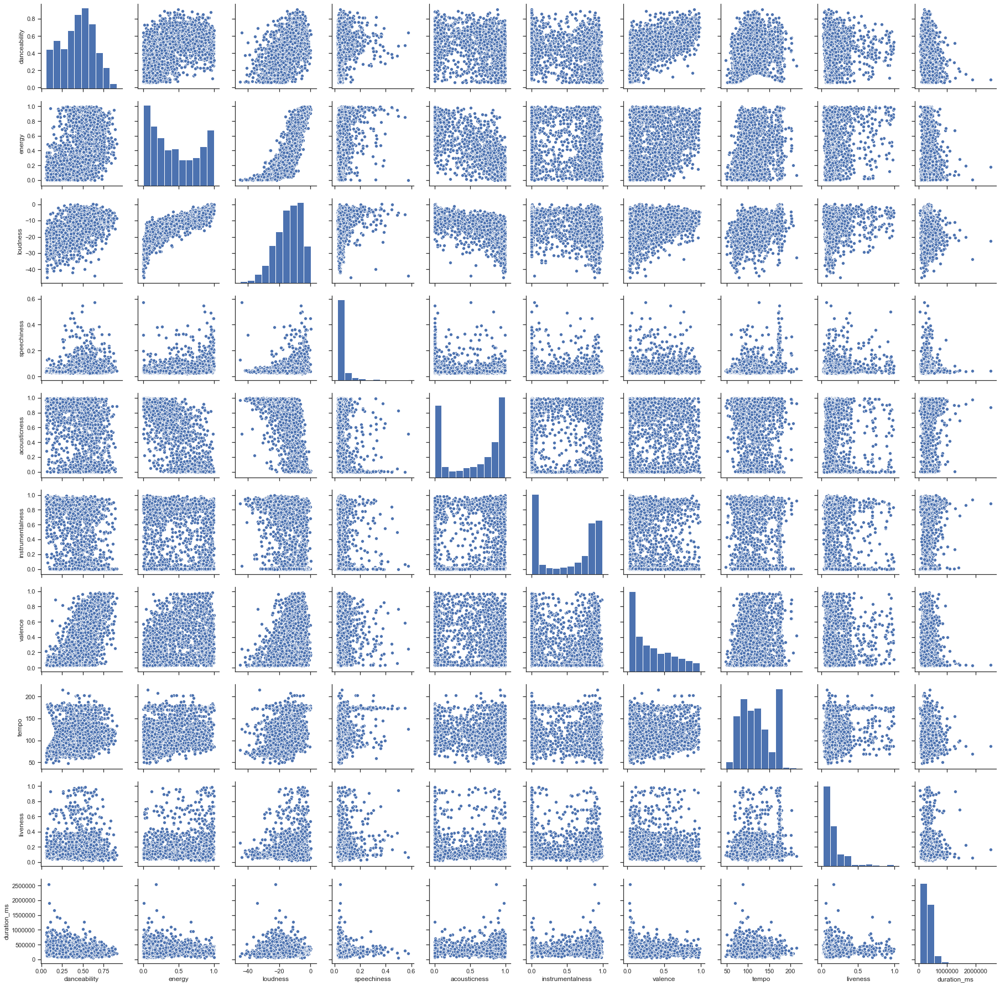

In [15]:
sns.set(style="ticks")
sns.pairplot(audio_features_more_reduced);
audio_features_more_reduced.corr()

Estandarizar y volver a generar un gráfico tipo *scatter matrix*

In [29]:
ss = StandardScaler()
audio_features_norm = pd.DataFrame(ss.fit_transform(audio_features_more_reduced))

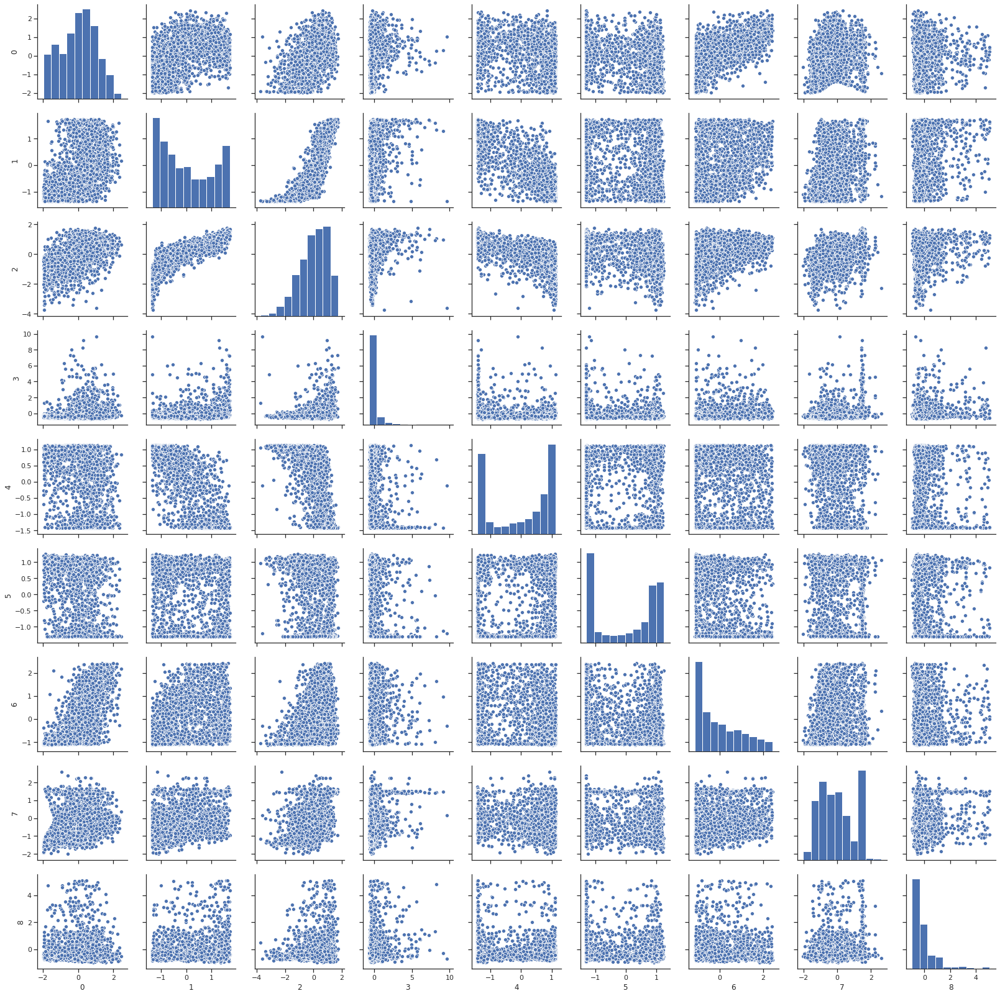

In [31]:
# Este scatter matrix da exactamente igual al anterior
# Yo creo que porque estas variables ya vienen normalizadas (entre 0 y 1) desde Spotify.
sns.set(style="ticks")
sns.pairplot(audio_features_norm);

In [32]:
ss = StandardScaler()
audio_features_norm2 = pd.DataFrame(ss.fit_transform(audio_features_reduced))

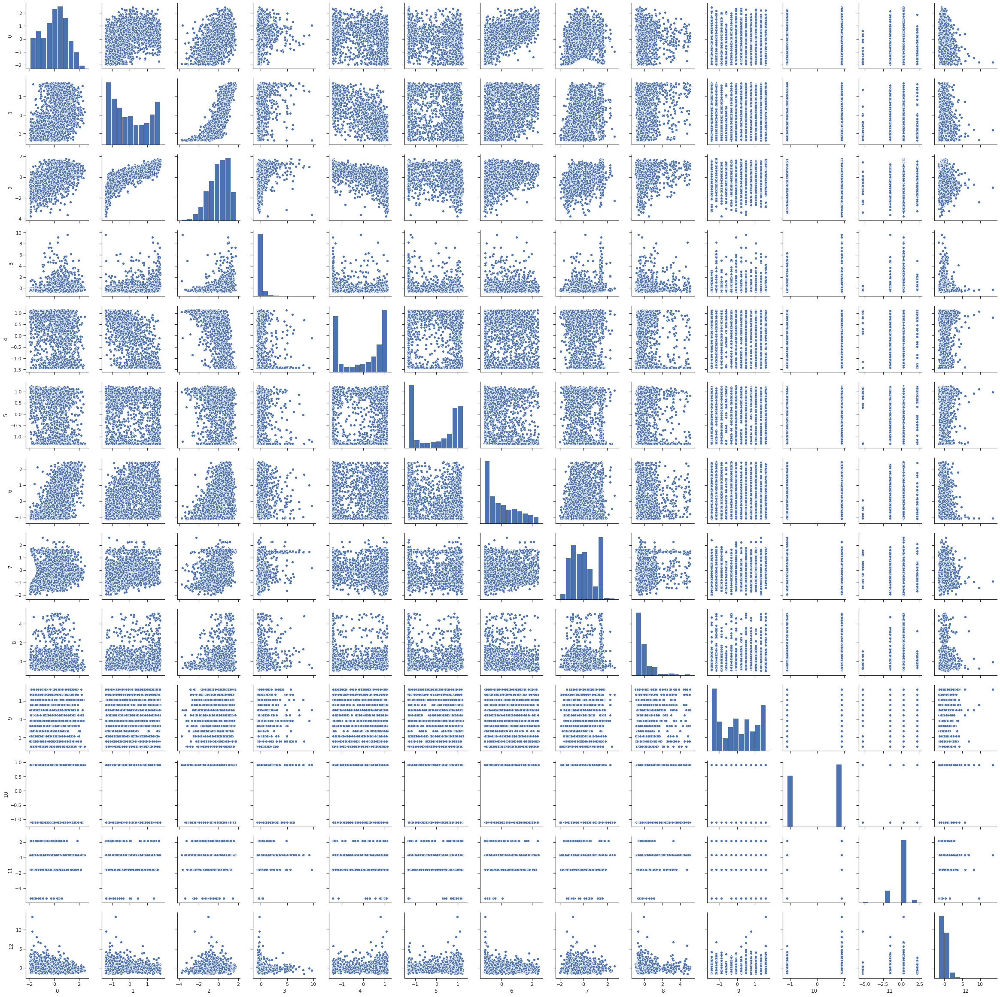

In [33]:
# Lo mismo que el anterior: la scatter matrix da igual normalizada
sns.set(style="ticks")
sns.pairplot(audio_features_norm2);

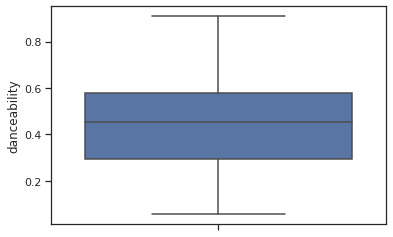

In [17]:
sns.boxplot(y='danceability', data=audio_features)

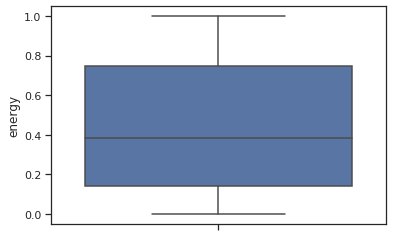

In [18]:
sns.boxplot(y='energy', data=audio_features)

In [22]:
audio_features.describe()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
count,2206.000000,2206.000000,2.206000e+03,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000
mean,0.556379,0.437174,3.184294e+05,0.439957,0.508918,5.255666,0.175765,-14.134093,0.550317,0.060247,120.272359,3.836809,0.324883
std,0.392763,0.193100,1.643673e+05,0.322410,0.390529,3.530997,0.159130,8.189815,0.497575,0.053385,36.347364,0.537590,0.268982
min,0.000005,0.057000,4.855300e+04,0.000581,0.000000,0.000000,0.018500,-44.809000,0.000000,0.023400,47.382000,1.000000,0.019600
25%,0.061700,0.294250,2.170865e+05,0.140250,0.014000,2.000000,0.092200,-19.540000,0.000000,0.037125,89.156500,4.000000,0.078350
50%,0.718000,0.453000,2.892135e+05,0.383000,0.660000,5.000000,0.113000,-13.133000,1.000000,0.043900,115.696500,4.000000,0.252000
75%,0.923750,0.580000,3.717565e+05,0.748750,0.882000,8.000000,0.187750,-7.498250,1.000000,0.058300,149.970000,4.000000,0.529000
max,0.996000,0.909000,2.533813e+06,0.999000,0.994000,11.000000,0.987000,0.326000,1.000000,0.575000,214.744000,5.000000,0.981000


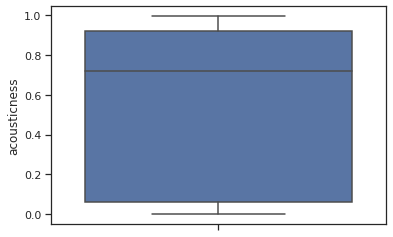

In [25]:
sns.boxplot(y='acousticness', data=audio_features)

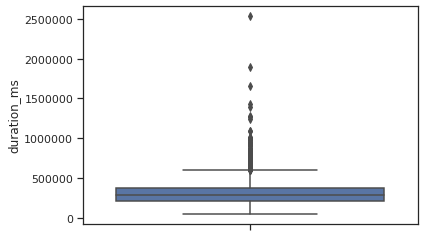

In [26]:
sns.boxplot(y='duration_ms', data=audio_features)

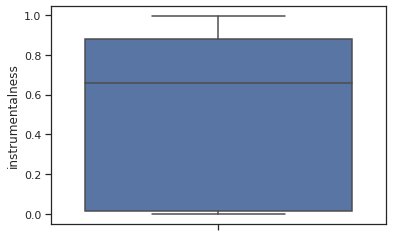

In [27]:
sns.boxplot(y='instrumentalness', data=audio_features)

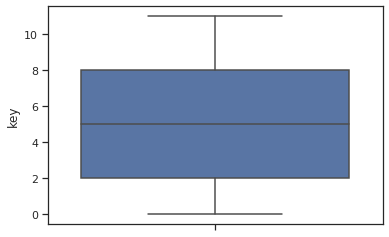

In [28]:
sns.boxplot(y='key', data=audio_features)

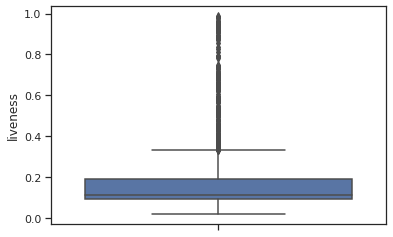

In [29]:
sns.boxplot(y='liveness', data=audio_features)

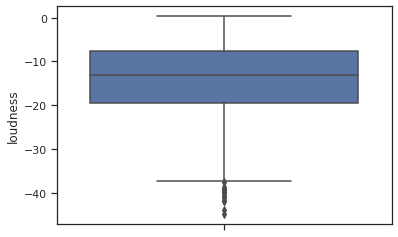

In [30]:
sns.boxplot(y='loudness', data=audio_features)

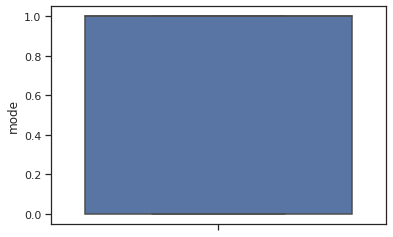

In [31]:
sns.boxplot(y='mode', data=audio_features)

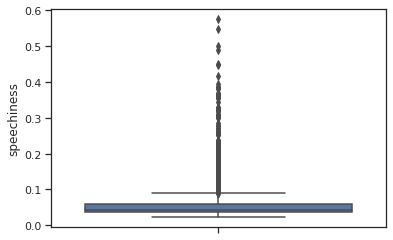

In [32]:
sns.boxplot(y='speechiness', data=audio_features)

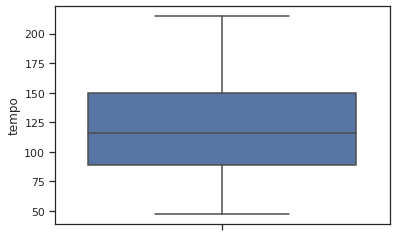

In [33]:
sns.boxplot(y='tempo', data=audio_features)

In [16]:
#se calcular los outliers salvajes
#deteccion de outliers extremos
#se considera un outlier extremo menor a q1-3ri o mayor a q3+3ri. ri = q3-q1
def is_extreme_outlier(x):
    describe = x.describe()
    q3 = describe[6]
    q1 = describe[4]
    ri3 = (describe[6]-describe[4])*3
    lim_inf = q1 - ri3
    lim_sup = q3 + ri3
    count = x[x > lim_sup].size + x[x < lim_inf].size
    return pd.Series([count])


result_outlier_extremes = pd.melt(audio_features_more_reduced.apply(is_extreme_outlier, axis = 0))
result_outlier_extremes = result_outlier_extremes[result_outlier_extremes['value']  > 0]
result_outlier_extremes

,variable,value
3,speechiness,154
8,liveness,122
9,duration_ms,31


In [13]:
audio_features_more_reduced.describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,valence,tempo,liveness
count,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000
mean,0.437174,0.439957,-14.134093,0.060247,0.556379,0.508918,0.324883,120.272359,0.175765
std,0.193100,0.322410,8.189815,0.053385,0.392763,0.390529,0.268982,36.347364,0.159130
min,0.057000,0.000581,-44.809000,0.023400,0.000005,0.000000,0.019600,47.382000,0.018500
25%,0.294250,0.140250,-19.540000,0.037125,0.061700,0.014000,0.078350,89.156500,0.092200
50%,0.453000,0.383000,-13.133000,0.043900,0.718000,0.660000,0.252000,115.696500,0.113000
75%,0.580000,0.748750,-7.498250,0.058300,0.923750,0.882000,0.529000,149.970000,0.187750
max,0.909000,0.999000,0.326000,0.575000,0.996000,0.994000,0.981000,214.744000,0.987000


In [35]:
audio_features['key'].value_counts()

0     243
5     237
7     233
2     215
1     213
9     192
4     175
11    170
10    165
8     144
6     126
3      93
Name: key, dtype: int64

In [36]:
audio_features['mode'].value_counts()

1    1214
0     992
Name: mode, dtype: int64

In [37]:
audio_features['time_signature'].value_counts()

4    1750
3     348
5      78
1      30
Name: time_signature, dtype: int64

In [50]:
audio_features['key'].dtype

dtype('int64')

In [51]:
audio_features['key'] = audio_features['key'].astype(CategoricalDtype(ordered=True))

In [52]:
audio_features['key'].dtype

CategoricalDtype(categories=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], ordered=True)

In [53]:
audio_features['mode'] = audio_features['mode'].astype(CategoricalDtype(ordered=True))
audio_features['time_signature'] = audio_features['time_signature'].astype(CategoricalDtype(ordered=True))

In [54]:
audio_features['mode'].dtype

CategoricalDtype(categories=[0, 1], ordered=True)

In [55]:
audio_features['time_signature'].dtype

CategoricalDtype(categories=[1, 3, 4, 5], ordered=True)

In [57]:
audio_features['type'].head()

id
5i2sgqnzaxYpvXmGAB592h    audio_features
4mGzm5ahHxMX5IhVWbU7cl    audio_features
4DEn3hZzSs9MFwFNDla5Y5    audio_features
5P6vo51dtkBYWXswH1twvK    audio_features
29TZQMVLv25CBm3bYn2EIQ    audio_features
Name: type, dtype: object

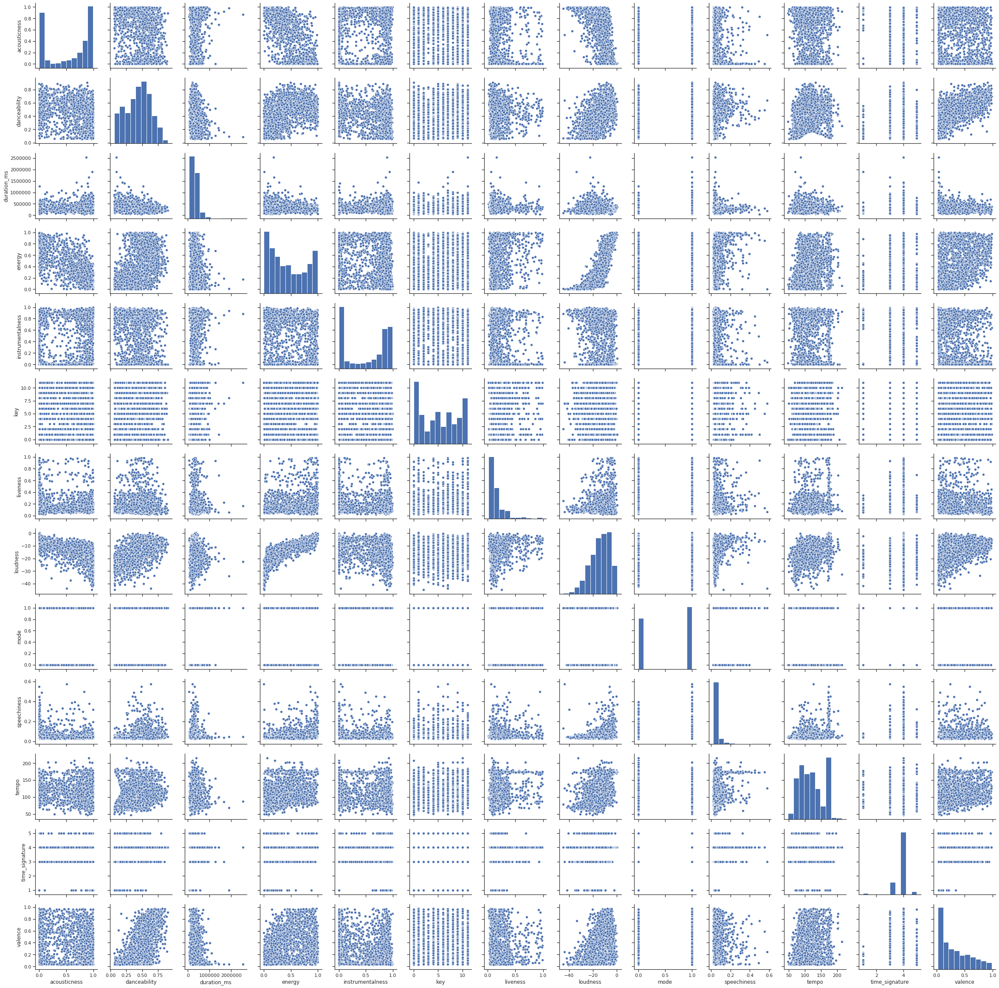

In [61]:
audio_features_reduced = audio_features[['acousticness','danceability', 'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness','loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence']]
sns.set(style="ticks")
sns.pairplot(audio_features_reduced)

In [63]:
audio_features_reduced.dtypes

acousticness         float64
danceability         float64
duration_ms            int64
energy               float64
instrumentalness     float64
key                 category
liveness             float64
loudness             float64
mode                category
speechiness          float64
tempo                float64
time_signature      category
valence              float64
dtype: object

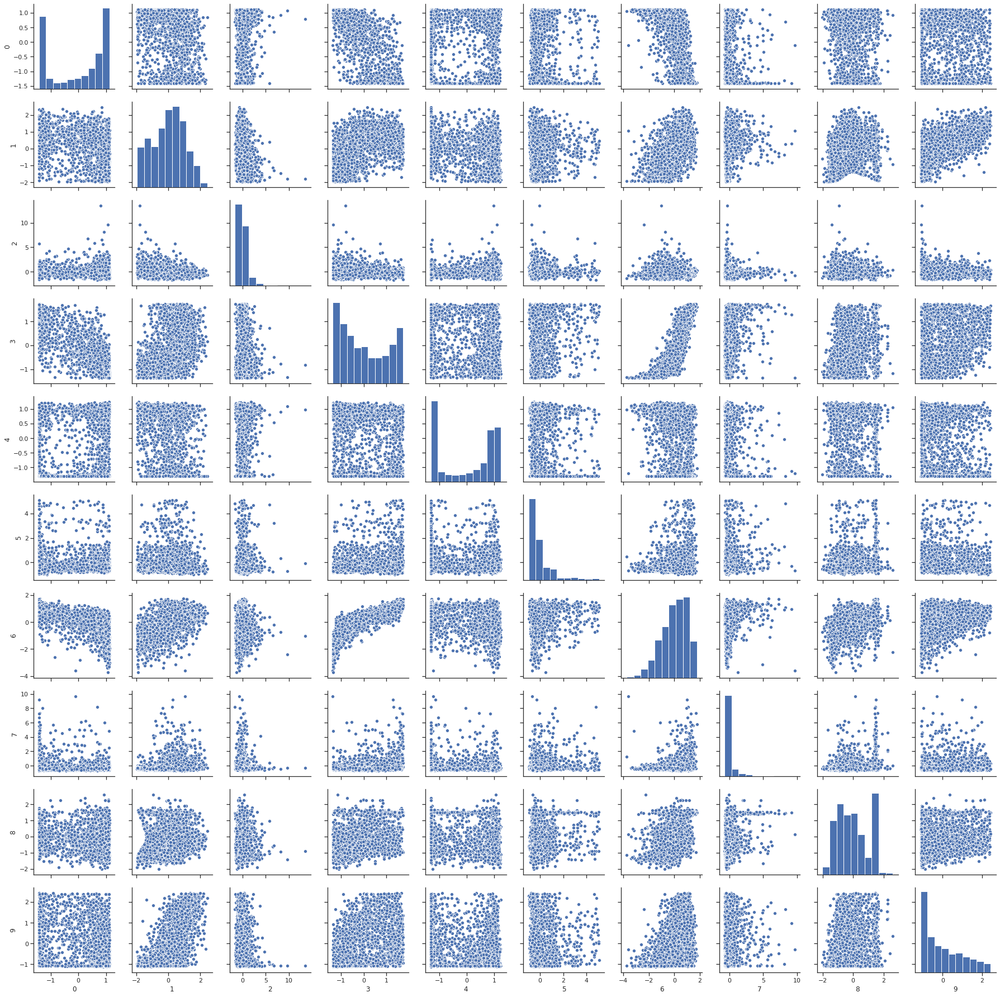

In [66]:
audio_features_more_reduced = audio_features[['acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness','speechiness', 'tempo', 'valence']]
ss = StandardScaler()
audio_features_norm = pd.DataFrame(ss.fit_transform(audio_features_more_reduced))
sns.set(style="ticks")
sns.pairplot(audio_features_norm)

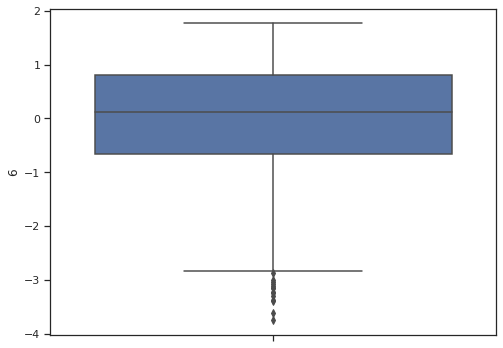

In [70]:
sns.boxplot(y=6, data=audio_features_norm)

In [71]:
audio_features_norm.corr()

,0,1,2,3,4,5,6,7,8,9
0,1.000000,-0.335133,-0.015911,-0.833011,0.199828,-0.241074,-0.716542,-0.254333,-0.483857,-0.206942
1,-0.335133,1.000000,-0.197828,0.449575,-0.367129,0.034854,0.499977,0.177873,0.229456,0.680345
2,-0.015911,-0.197828,1.000000,-0.047300,0.143622,0.035349,-0.058933,-0.045162,-0.046465,-0.190217
3,-0.833011,0.449575,-0.047300,1.000000,-0.274126,0.285643,0.866154,0.304040,0.541612,0.399903
4,0.199828,-0.367129,0.143622,-0.274126,1.000000,-0.083062,-0.381098,-0.153158,-0.087814,-0.417827
5,-0.241074,0.034854,0.035349,0.285643,-0.083062,1.000000,0.229684,0.185036,0.159391,0.058733
6,-0.716542,0.499977,-0.058933,0.866154,-0.381098,0.229684,1.000000,0.218152,0.481935,0.409778
7,-0.254333,0.177873,-0.045162,0.304040,-0.153158,0.185036,0.218152,1.000000,0.201080,0.146733
8,-0.483857,0.229456,-0.046465,0.541612,-0.087814,0.159391,0.481935,0.201080,1.000000,0.142934
9,-0.206942,0.680345,-0.190217,0.399903,-0.417827,0.058733,0.409778,0.146733,0.142934,1.000000


In [78]:
audio_features.shape

(2206, 17)

In [79]:
audio_features

,acousticness,analysis_url,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
id,,,,,,,,,,,,,,,,,
5i2sgqnzaxYpvXmGAB592h,0.95700,https://api.spotify.com/v1/audio-analysis/5i2s...,0.5240,253933,0.10800,0.001230,0,0.1390,-18.361,1,0.0493,127.982,4,https://api.spotify.com/v1/tracks/5i2sgqnzaxYp...,audio_features,spotify:track:5i2sgqnzaxYpvXmGAB592h,0.3220
4mGzm5ahHxMX5IhVWbU7cl,0.95300,https://api.spotify.com/v1/audio-analysis/4mGz...,0.4800,249823,0.03220,0.000004,4,0.0980,-23.781,1,0.0604,121.766,4,https://api.spotify.com/v1/tracks/4mGzm5ahHxMX...,audio_features,spotify:track:4mGzm5ahHxMX5IhVWbU7cl,0.1720
4DEn3hZzSs9MFwFNDla5Y5,0.98900,https://api.spotify.com/v1/audio-analysis/4DEn...,0.3940,185827,0.15000,0.908000,5,0.3420,-21.133,0,0.0353,97.738,3,https://api.spotify.com/v1/tracks/4DEn3hZzSs9M...,audio_features,spotify:track:4DEn3hZzSs9MFwFNDla5Y5,0.1700
5P6vo51dtkBYWXswH1twvK,0.17400,https://api.spotify.com/v1/audio-analysis/5P6v...,0.4610,645894,0.77300,0.702000,9,0.6920,-10.316,0,0.1470,130.109,5,https://api.spotify.com/v1/tracks/5P6vo51dtkBY...,audio_features,spotify:track:5P6vo51dtkBYWXswH1twvK,0.4880
29TZQMVLv25CBm3bYn2EIQ,0.43600,https://api.spotify.com/v1/audio-analysis/29TZ...,0.4520,326400,0.50100,0.900000,10,0.1100,-13.149,0,0.0329,111.203,4,https://api.spotify.com/v1/tracks/29TZQMVLv25C...,audio_features,spotify:track:29TZQMVLv25CBm3bYn2EIQ,0.6020
4cUgsvo0xRu0JQXIhxcXkZ,0.82200,https://api.spotify.com/v1/audio-analysis/4cUg...,0.6150,186467,0.59400,0.861000,8,0.1060,-11.719,1,0.2340,86.657,4,https://api.spotify.com/v1/tracks/4cUgsvo0xRu0...,audio_features,spotify:track:4cUgsvo0xRu0JQXIhxcXkZ,0.5860
6gkIIBgZx2661g01Nz5Qtr,0.65200,https://api.spotify.com/v1/audio-analysis/6gkI...,0.3240,197147,0.20300,0.001090,0,0.1060,-12.948,0,0.0397,207.423,4,https://api.spotify.com/v1/tracks/6gkIIBgZx266...,audio_features,spotify:track:6gkIIBgZx2661g01Nz5Qtr,0.1980
2uwWxQaPESir0zpeVcHRvC,0.07730,https://api.spotify.com/v1/audio-analysis/2uwW...,0.7010,408467,0.51300,0.881000,7,0.1130,-14.369,0,0.0340,90.886,4,https://api.spotify.com/v1/tracks/2uwWxQaPESir...,audio_features,spotify:track:2uwWxQaPESir0zpeVcHRvC,0.7400
57FfMOh9wOQ7IDDK2tmigg,0.73400,https://api.spotify.com/v1/audio-analysis/57Ff...,0.5010,305439,0.30300,0.000123,9,0.1390,-10.722,0,0.0367,130.031,4,https://api.spotify.com/v1/tracks/57FfMOh9wOQ7...,audio_features,spotify:track:57FfMOh9wOQ7IDDK2tmigg,0.5370
